# Forest Fire Prediction using SVM
### classify the Size_Category of burned area


# What is Support Vector Machine?
- **Support Vector Machines(SVM)** are powerful ML algorithm that are used for classification amd regression puroses.
- SVM Classifier  builds a model that assigns new datapoint to one of the given categories.
- Thus ,It can be viewed as **Non-Probabilistic binary Linear Classifier.**
- SVMs can efficiently perform a non-Linear classification using the `Kernal Trick`.It enable us to implicitly map the inputs into high dimentional feature spaces.

## SVM Terminology

### Hyper-Plane :
- A hyperplane is a decision boundary which separates between given set of data points having different class labels. The SVM classifier separates data points using a hyperplane with the maximum amount of margin. 
- This hyperplane is known as the maximum margin hyperplane and the linear classifier it defines is known as the maximum margin classifier.

### Margin:
- A margin is a separation gap between the two lines on the closest data points. It is calculated as the perpendicular distance from the line to support vectors or closest data points. 
- In SVMs, we try to maximize this separation gap so that we get maximum margin.



In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from dataprep.eda import plot, create_report
import scipy.stats as stat
from collections import Counter
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE,  ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold , GridSearchCV, train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import roc_curve, roc_auc_score , recall_score , precision_score, f1_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score


import warnings
warnings.filterwarnings('ignore')


In [2]:
data = pd.read_csv('forestfires.csv')
data

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


## Data Description:
- month= month of the year: 'jan' to 'dec'
- day = day of the week: 'mon' to 'sun'
- FFMC= FFMC index from the FWI system: 18.7 to 96.20
- DMC= Duff Moisture Code index from the FWI system: 1.1 to 291.3
- DC =Drought Code index from the FWI system: 7.9 to 860.6
- ISI = ISI index from the FWI system: 0.0 to 56.10
- temp= temperature in Celsius degrees: 2.2 to 33.30
- RH = relative humidity in %: 15.0 to 100
- wind =wind speed in km/h: 0.40 to 9.40
- rain= outside rain in mm/m2 : 0.0 to 6.4
- Size_Category = the burned area of the forest ( Small , Large)

In [3]:
data.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

In [3]:
#Drop unnecessary columns
data.drop(['dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep'],inplace=True,axis=1)
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,small


In [4]:
data.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  size_category  517 non-null    object 
dtypes: float64(8), int64(1), object(3)
memory usage: 48.6+ KB


In [6]:
data[data.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,0.00,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,0.00,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,28.66,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,0.00,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,0.00,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,0.00,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,0.00,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,0.00,small


- There are 8 duplicated value but we are not drop it beacuse we see some values are same in some columns like in **area** so that it show that duplicated values.
- There are no null values in data set.

### Numerical Values

In [7]:
df=data.copy()
num_features=df.describe(include=['int64','float64']).columns
num_features

Index(['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area'], dtype='object')

In [8]:
df[num_features].head()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


### Categorical Features

In [9]:
cat_features=df.describe(include=['object']).columns
cat_features

Index(['month', 'day', 'size_category'], dtype='object')

In [10]:
df[cat_features]

,month,day,size_category
0,mar,fri,small
1,oct,tue,small
2,oct,sat,small
3,mar,fri,small
4,mar,sun,small
...,...,...,...
512,aug,sun,large
513,aug,sun,large
514,aug,sun,large
515,aug,sat,small


In [11]:
for i in cat_features:
    print(' ')
    print(df[i].value_counts())

 
aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
jan      2
may      2
nov      1
Name: month, dtype: int64
 
sun    95
fri    85
sat    84
mon    74
tue    64
thu    61
wed    54
Name: day, dtype: int64
 
small    378
large    139
Name: size_category, dtype: int64


In [12]:
# View frequency of categorical values
for i in cat_features:
    print(df[i].value_counts()/np.float(len(df)))
    print(' ')

aug    0.355899
sep    0.332689
mar    0.104449
jul    0.061896
feb    0.038685
jun    0.032882
oct    0.029014
apr    0.017408
dec    0.017408
jan    0.003868
may    0.003868
nov    0.001934
Name: month, dtype: float64
 
sun    0.183752
fri    0.164410
sat    0.162476
mon    0.143133
tue    0.123791
thu    0.117988
wed    0.104449
Name: day, dtype: float64
 
small    0.731141
large    0.268859
Name: size_category, dtype: float64
 


In [13]:
for i in cat_features:
    print(i,'contains',len(df[i].unique()),'categories.')

month contains 12 categories.
day contains 7 categories.
size_category contains 2 categories.


## Outlier Detection

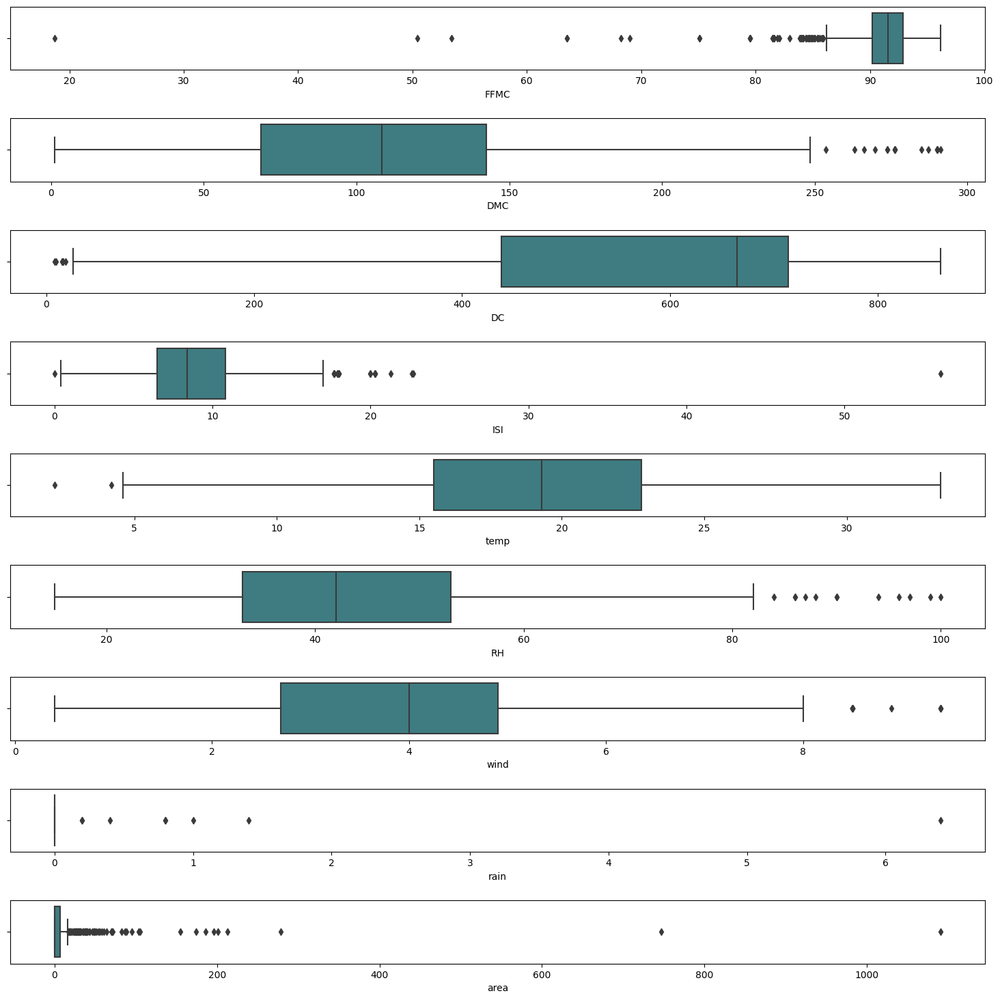

In [14]:
fig, axes=plt.subplots(9,1,figsize=(15,15),sharex=False,sharey=False)
sns.boxplot(x='FFMC',data=df,palette='crest',ax=axes[0])
sns.boxplot(x='DMC',data=df,palette='crest',ax=axes[1])
sns.boxplot(x='DC',data=df,palette='crest',ax=axes[2])
sns.boxplot(x='ISI',data=df,palette='crest',ax=axes[3])
sns.boxplot(x='temp',data=df,palette='crest',ax=axes[4])
sns.boxplot(x='RH',data=df,palette='crest',ax=axes[5])
sns.boxplot(x='wind',data=df,palette='crest',ax=axes[6])
sns.boxplot(x='rain',data=df,palette='crest',ax=axes[7])
sns.boxplot(x='area',data=df,palette='crest',ax=axes[8])
plt.tight_layout(pad=2.0)

There are lot of outliers present in the dataframe but we can't drop them because they are present in a very large quantity and can be important for model building.
### After Log-Transformation

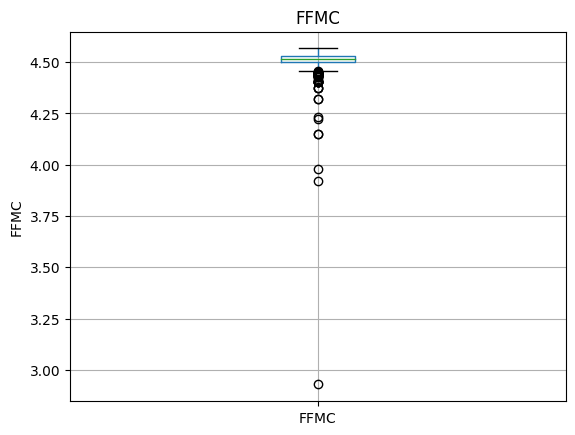

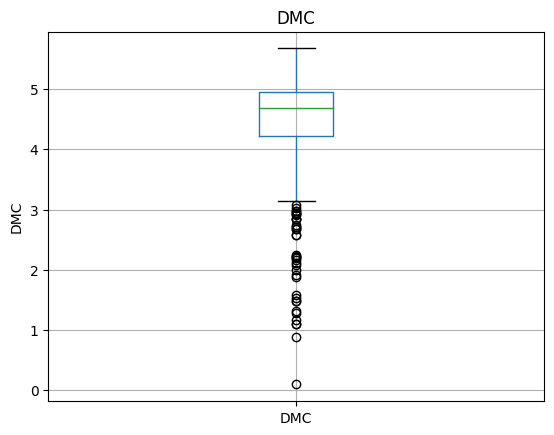

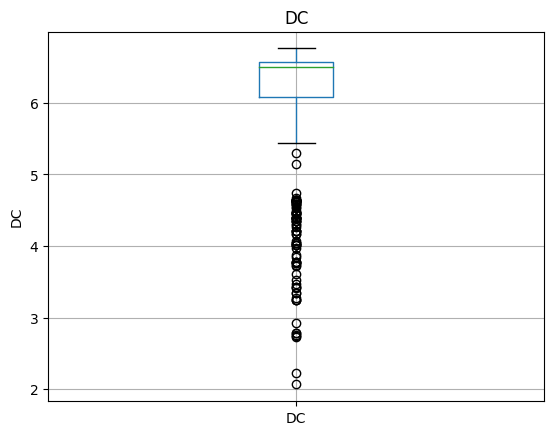

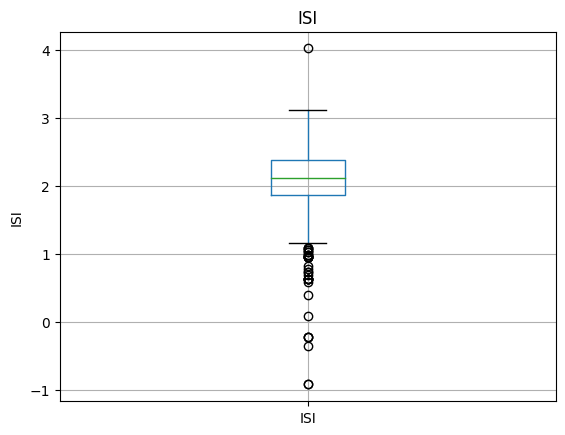

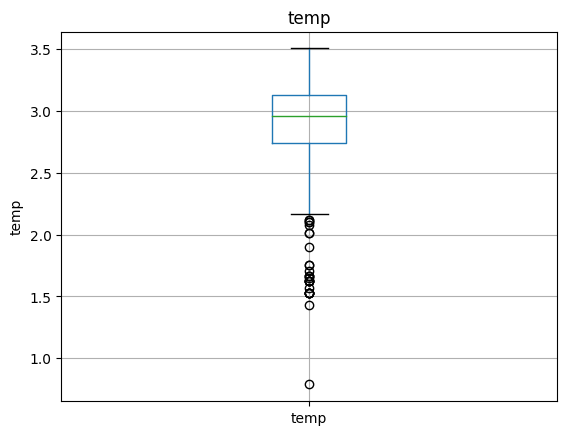

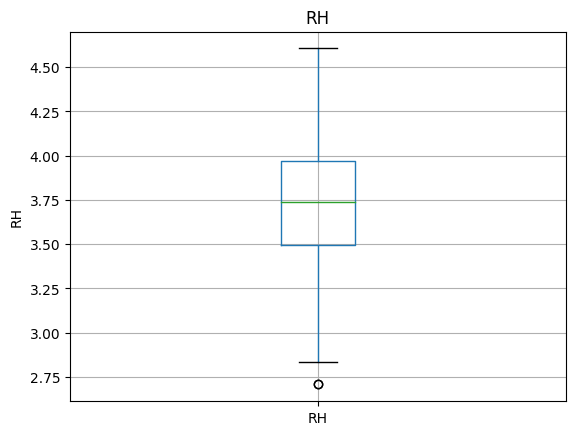

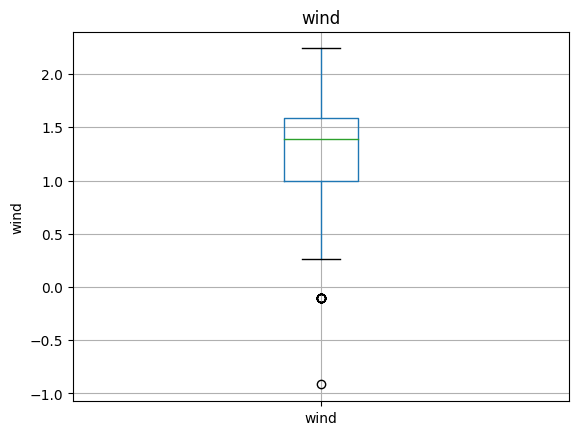

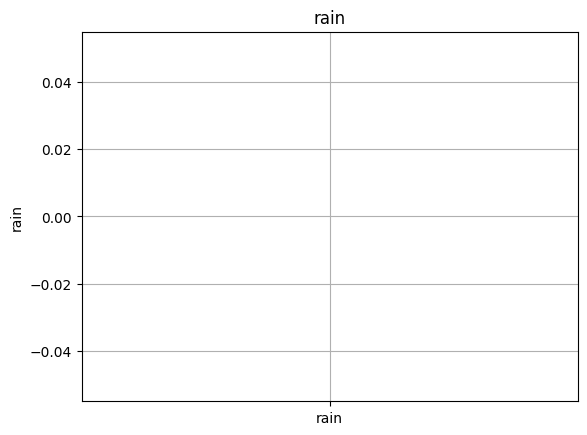

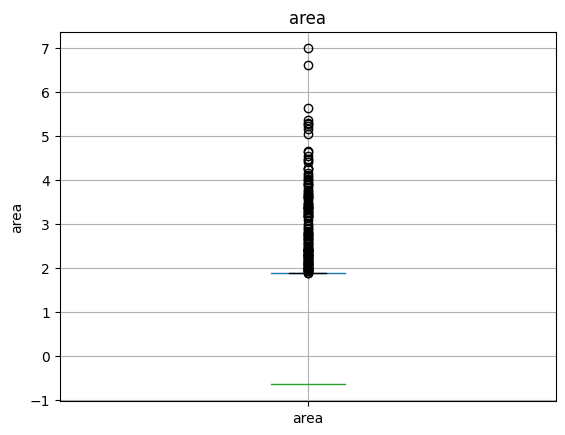

In [15]:
df1=df.copy()
for i in num_features:
    df1[i]=np.log(df1[i])
    df1.boxplot(column=i)
    plt.ylabel(i)
    plt.title(i)
    plt.show()

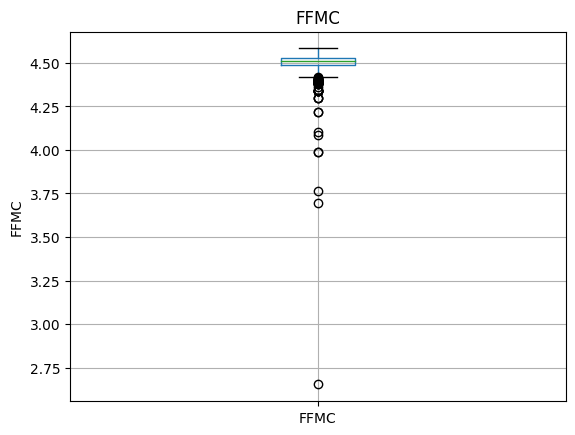

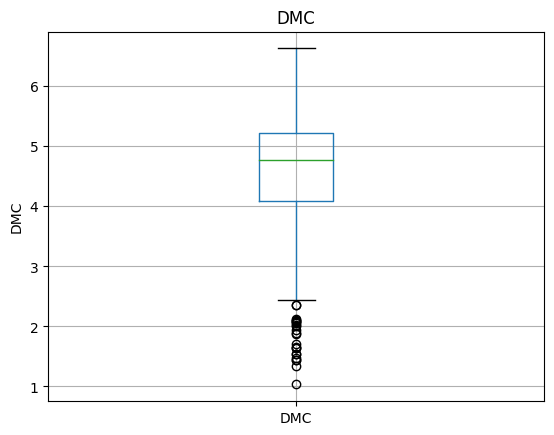

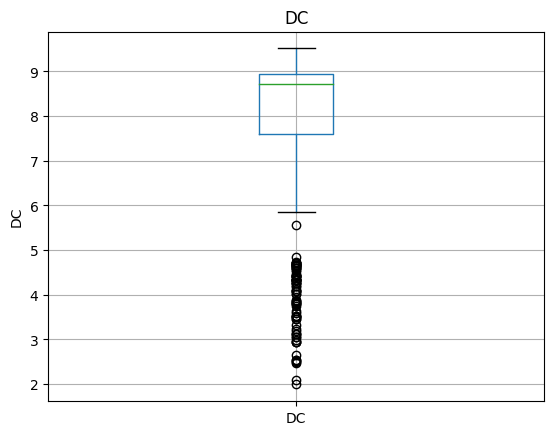

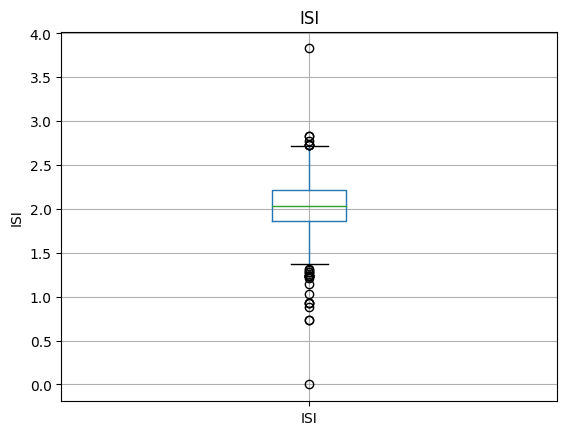

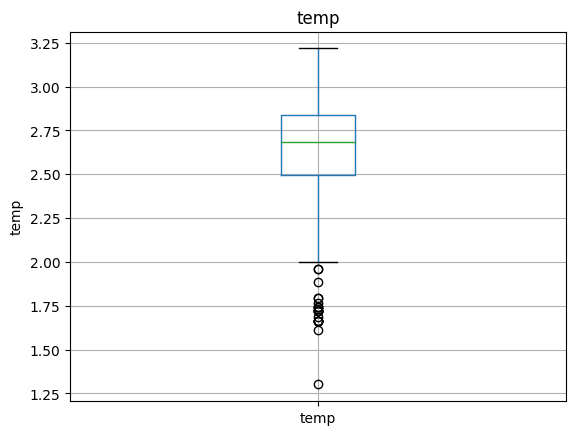

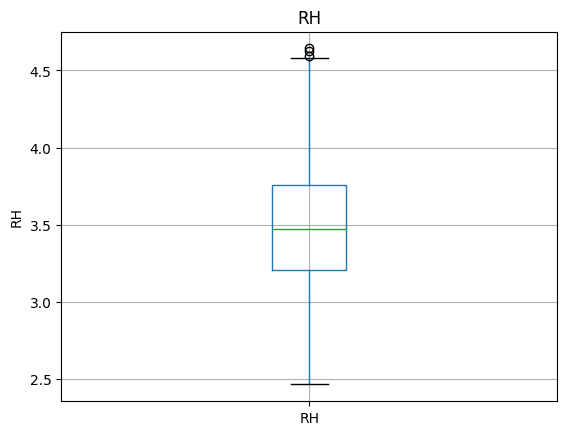

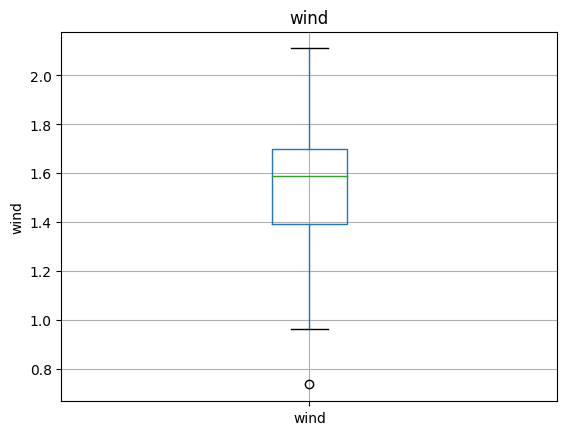

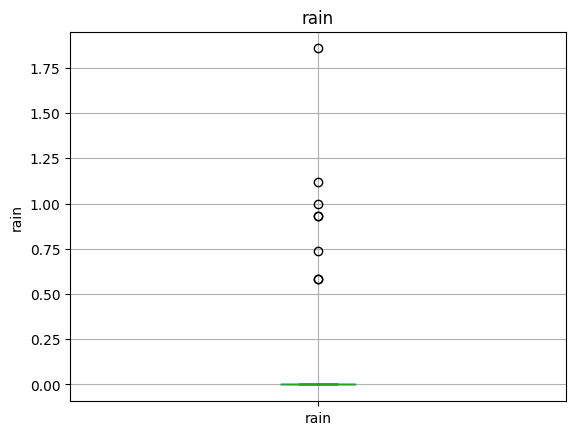

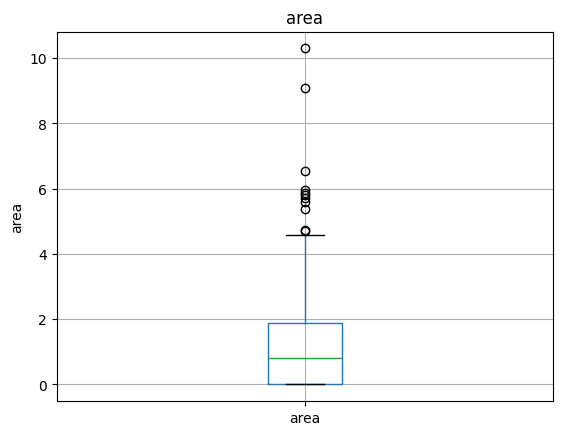

In [17]:
for i in num_features:
    df[i]=np.cbrt(df[i])
    df.boxplot(column=i)
    plt.ylabel(i)
    plt.title(i)
    plt.show()

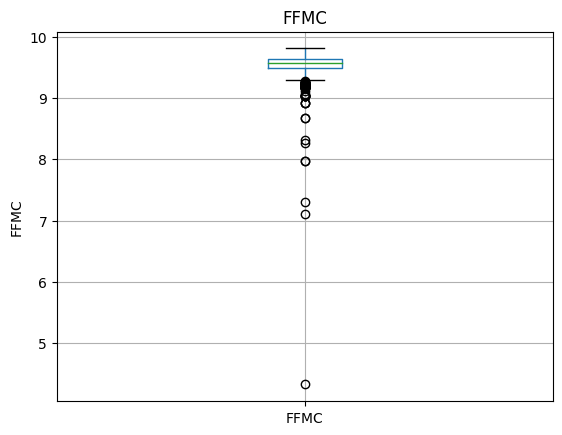

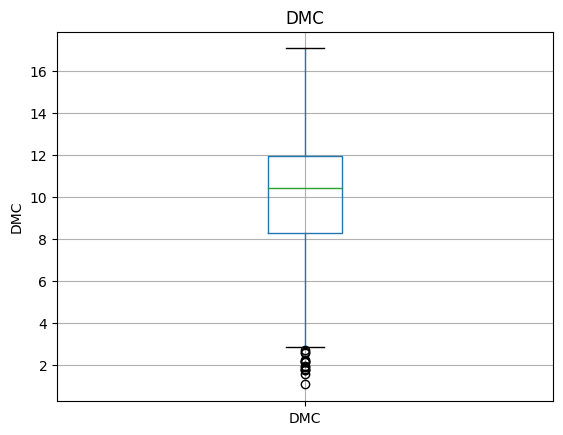

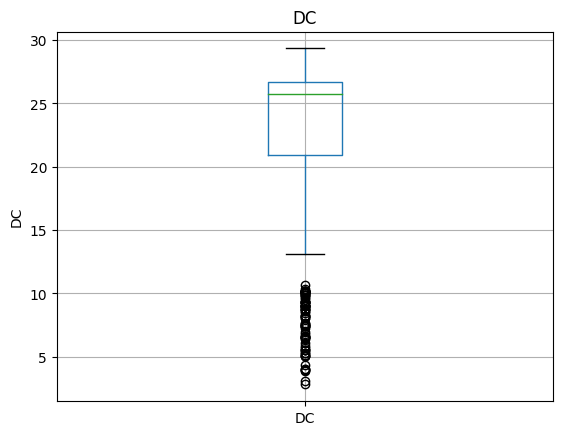

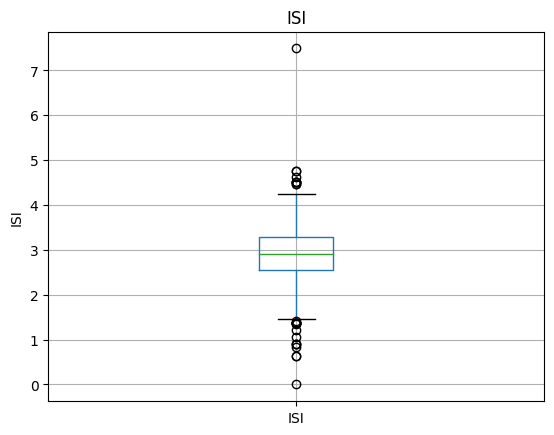

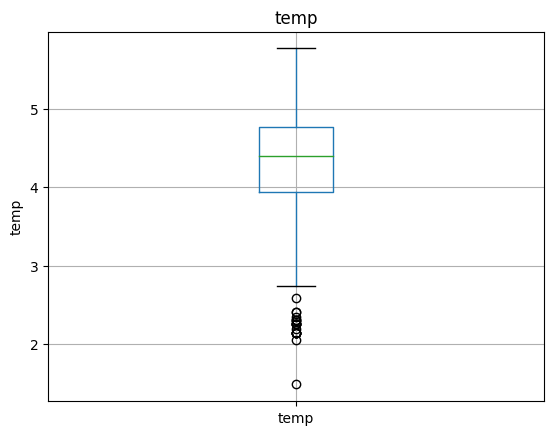

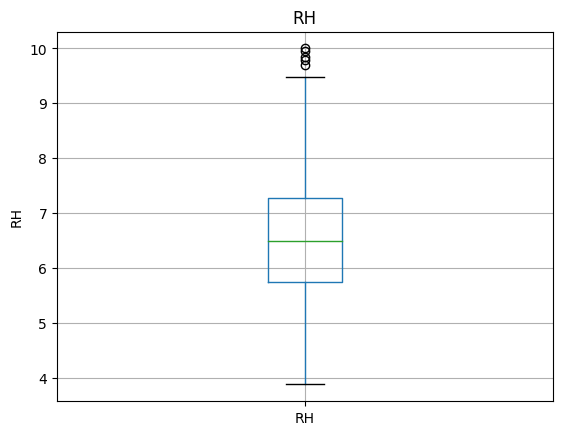

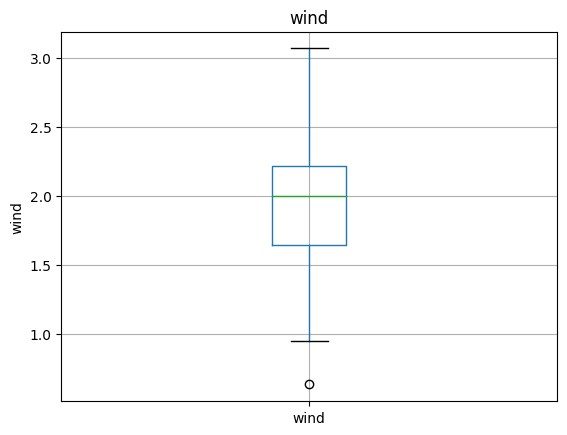

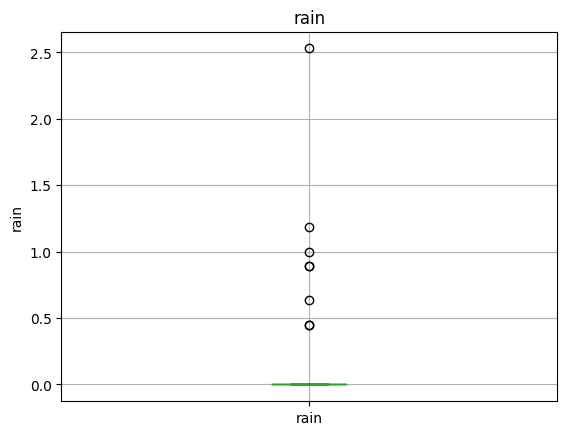

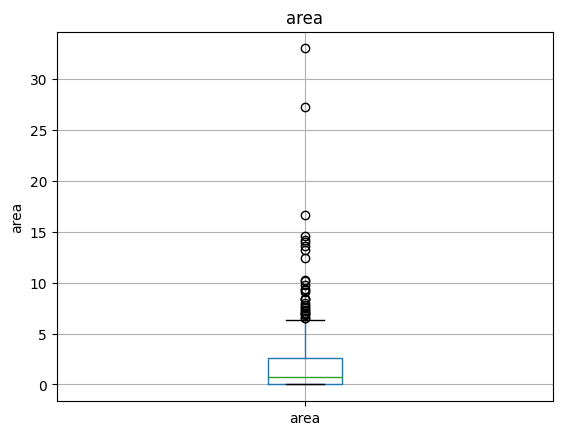

In [16]:
for i in num_features:
    df[i]=np.sqrt(df[i])
    df.boxplot(column=i)
    plt.ylabel(i)
    plt.title(i)
    plt.show()

- As we see that ,there are no changes using log,Sqreroot,Cuberoot transformation.
- so we use the Scaling before train-test split.

- Now we move forward for Data visulisations.

# Data Visualisation

In [17]:
df.corr()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
FFMC,1.000000,0.423428,0.305141,0.637661,0.410847,-0.270625,0.007913,0.060793,0.050856
DMC,0.423428,1.000000,0.772869,0.457206,0.562178,0.029844,-0.108676,0.093656,0.084570
DC,0.305141,0.772869,1.000000,0.330736,0.536709,-0.038167,-0.174128,0.039881,0.071072
ISI,0.637661,0.457206,0.330736,1.000000,0.448118,-0.163693,0.098452,0.091909,0.011572
temp,0.410847,0.562178,0.536709,0.448118,1.000000,-0.497974,-0.203375,0.054431,0.075595
RH,-0.270625,0.029844,-0.038167,-0.163693,-0.497974,1.000000,0.050578,0.159442,-0.073656
wind,0.007913,-0.108676,-0.174128,0.098452,-0.203375,0.050578,1.000000,0.099934,0.047901
rain,0.060793,0.093656,0.039881,0.091909,0.054431,0.159442,0.099934,1.000000,-0.018738
area,0.050856,0.084570,0.071072,0.011572,0.075595,-0.073656,0.047901,-0.018738,1.000000


<AxesSubplot: >

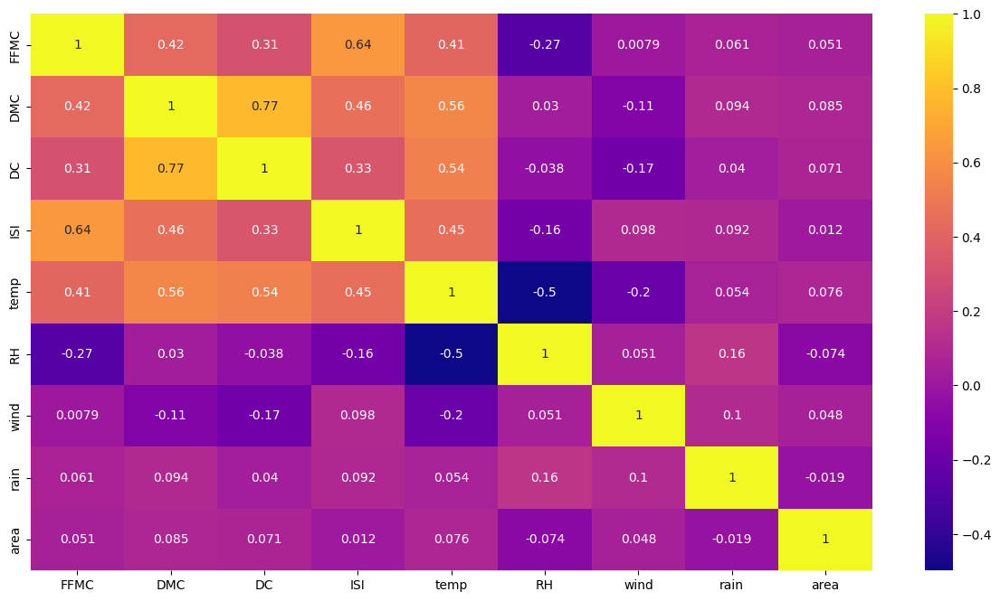

In [18]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(),annot=True,cmap='plasma')

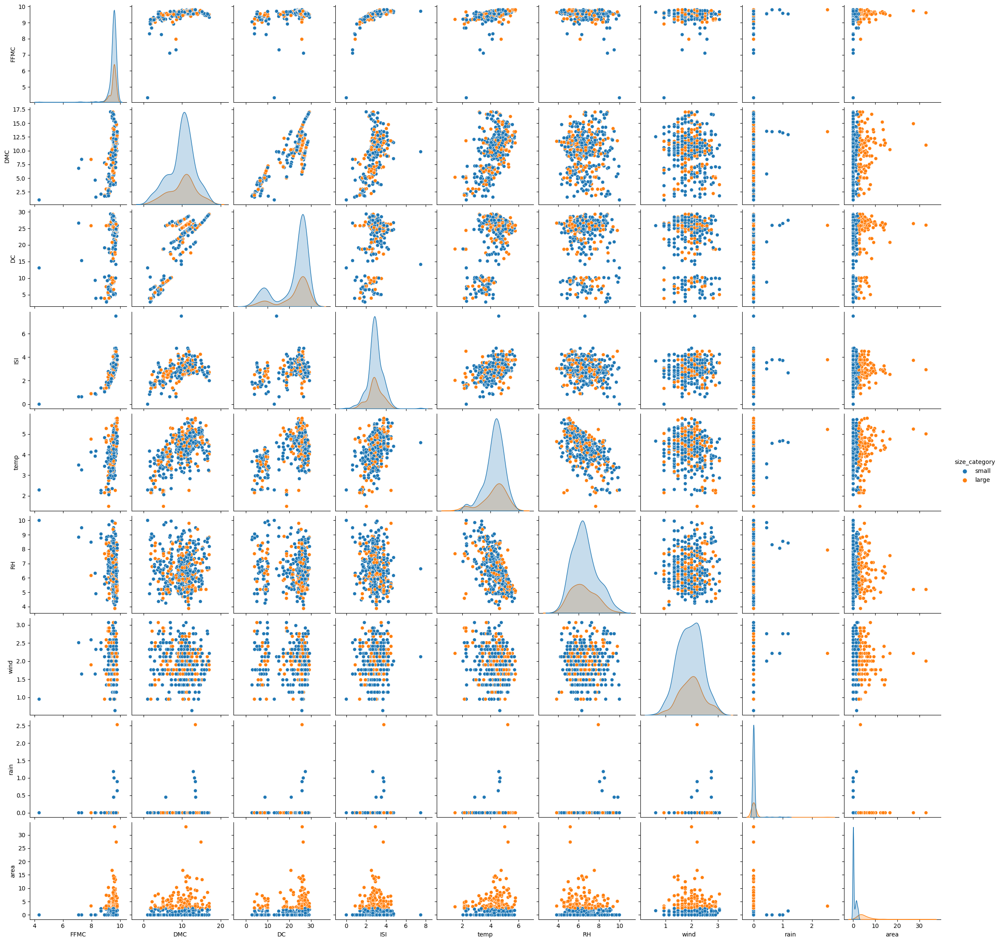

In [19]:
sns.pairplot(df,hue='size_category')
plt.show()

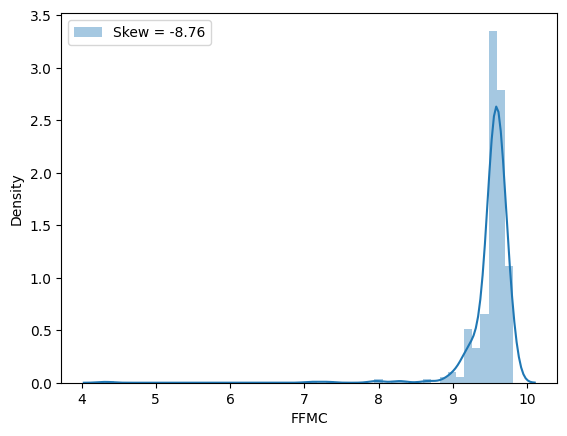

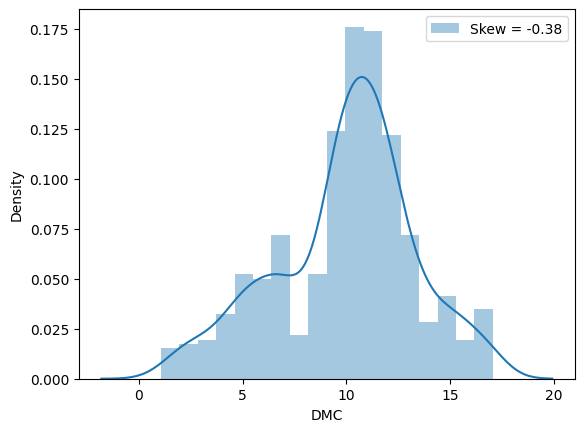

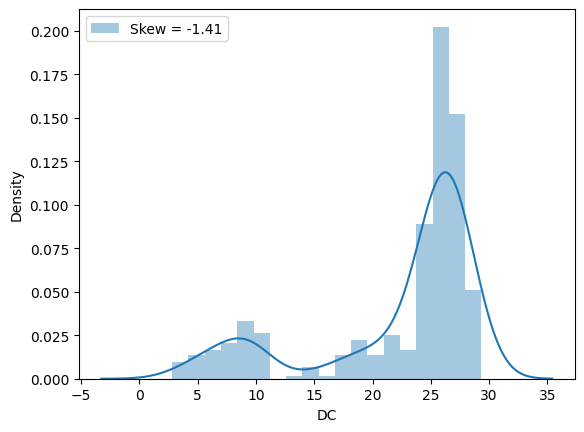

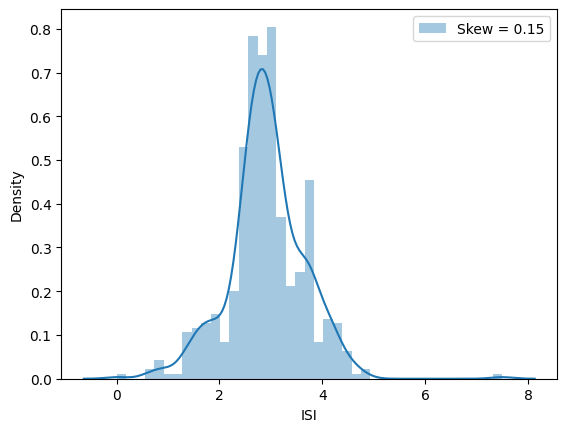

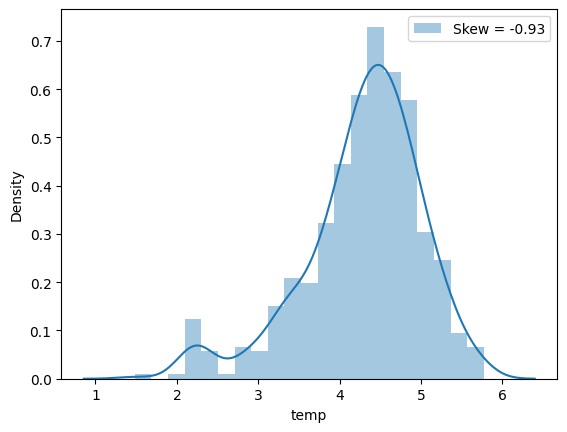

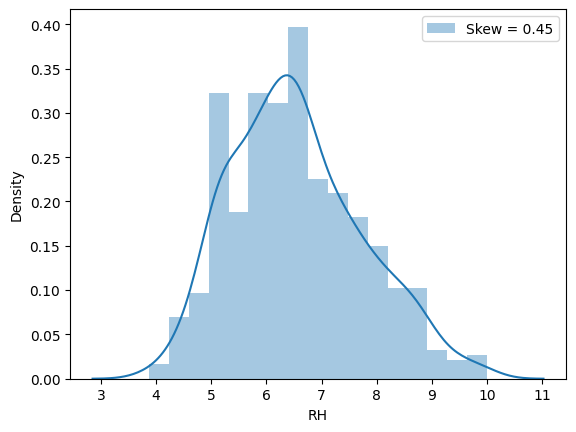

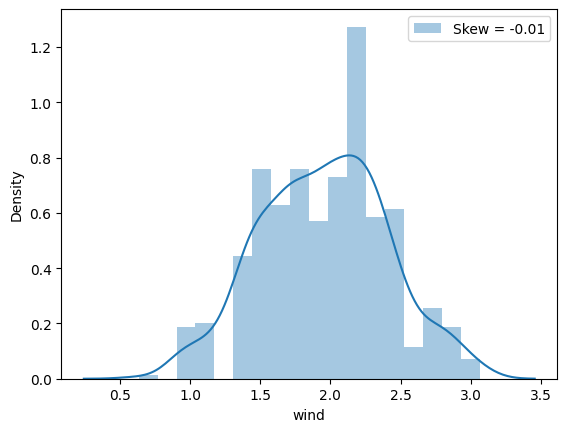

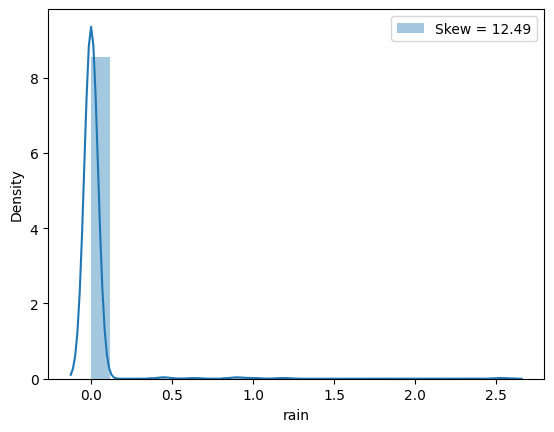

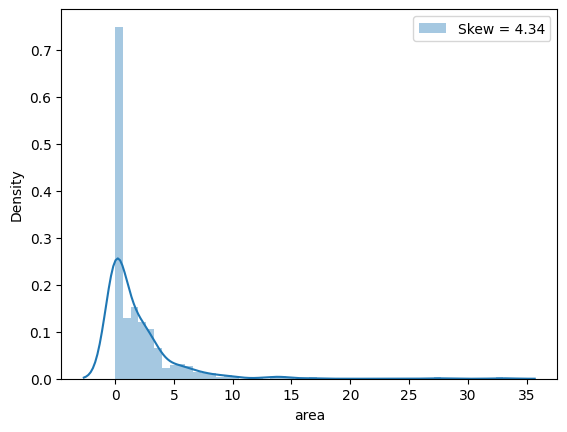

In [20]:
for i in num_features:
    skew=df[i].skew()
    sns.distplot(df[i],kde=True,label='Skew = %.2f' %(skew))
    plt.legend(loc='best')
    plt.show()

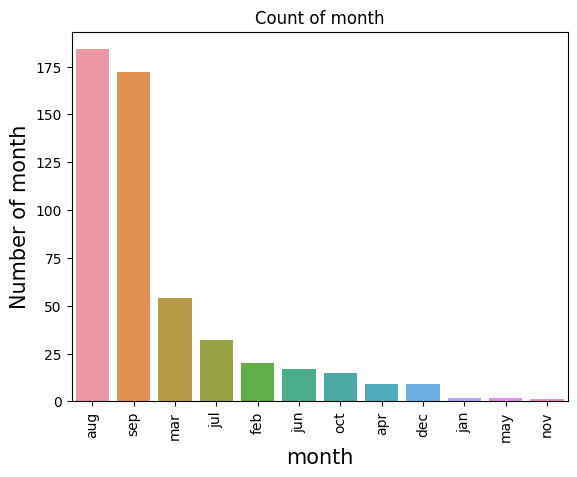

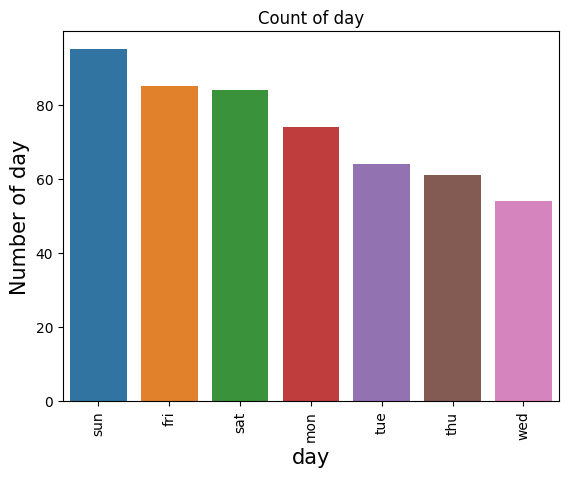

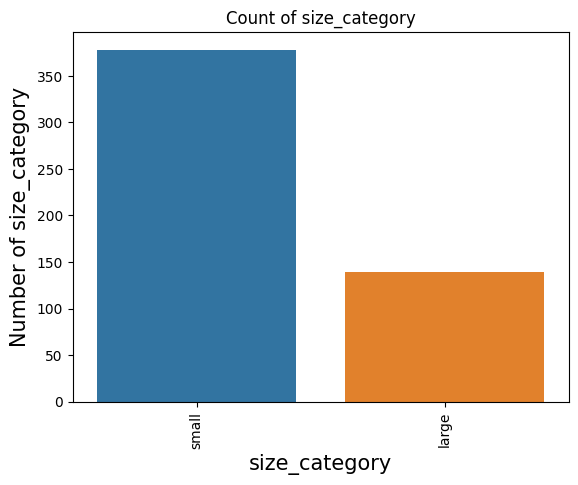

In [21]:
# For categorical features

for i,column in enumerate (cat_features):
    unique=df[column].value_counts()
    plt.title('Count of ' + column)
    ax=sns.countplot(data=df,x=column,order=df[column].value_counts().index);
    plt.xlabel(column,fontsize=15)
    plt.xticks(rotation=90)
    plt.ylabel('Number of '+ column,fontsize=15)
    plt.show()

- It is interesting to see that abnormally high number of the forest fires occur in the month of August and September.

- In the case of day, the days from Friday to Sunday have higher equal proportion of cases.

**Here we can see that the target varible is biased. Because the values of small is more than values of Large. So it gives biased output.**

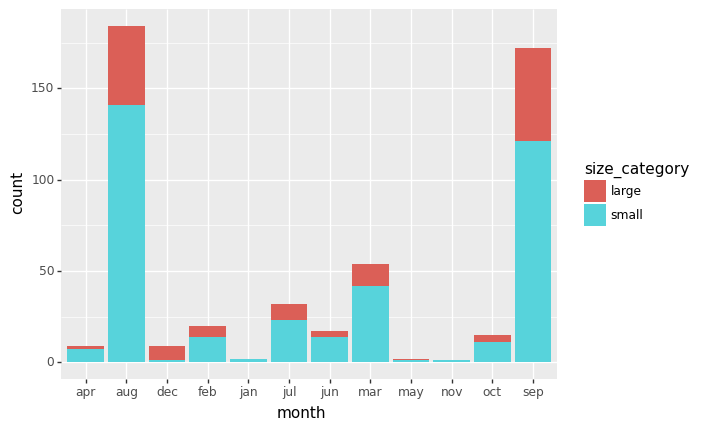

<ggplot: (152179649413)>

In [22]:
from plotnine import *
ggplot(df, aes(x='month', fill = 'size_category')) + \
    geom_bar(stat = 'count')

In [23]:
from plotnine import *
ax=ggplot(df, aes(x='day', fill = 'size_category')) + \
    geom_bar(stat = 'count')


### Now ,we visualize the distribution of "Area" and find some insights from it.

Skew:  4.338705170518166
Kurtosis:  30.745955665718963


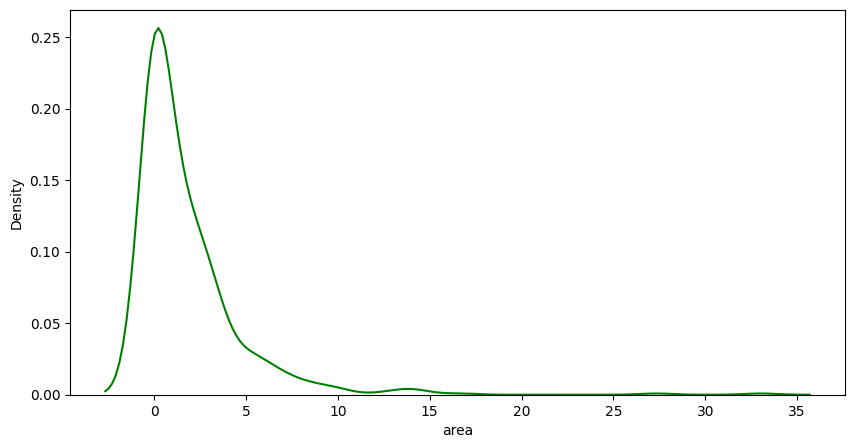

In [24]:
print('Skew: ',df['area'].skew())
print('Kurtosis: ',df['area'].kurtosis())

plt.figure(figsize=(10,5))
sns.distplot(df['area'],color='g',hist=False,kde=True)
plt.show()


<AxesSubplot: xlabel='area'>

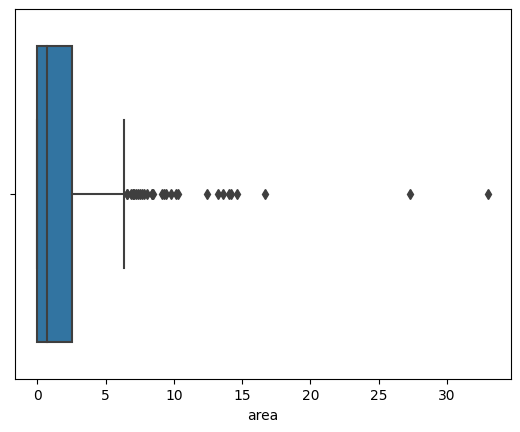

In [25]:
sns.boxplot(df['area'])

- The data is highly skewed with a value of +12.84 and huge kurtosis value of 194.
- It even tells you that majority of the forest fires do not cover a large area, most of the damaged area is under 50 hectares of land.
- We can apply tranformation to fix the skewnesss and kurtosis, however we will have to inverse transform before submitting the output.
- Outlier Check: There are 4 outlier instances in our area columns but the questions is should we drop it or not? (Will get back to this in the outlier treatment step)

### Bivariate analysis of all variabls in Dataset

In [26]:
df1=df.copy()

def area_cat(area):
    if area==0.0:
        return 'No Damage'
    elif area <=1:
        return 'Low Damage'
    elif area <=25:
        return 'Moderate Damage'
    elif area <=100:
        return 'High Damage'
    else:
        return 'Very High Damage'
    
df1['Damage Category']= df1['area'].apply(area_cat)
df1.head(10)

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category,Damage Category
0,mar,fri,9.284396,5.118594,9.710819,2.258318,2.863564,7.141428,2.588436,0.000000,0.0,small,No Damage
1,oct,tue,9.518403,5.949790,25.866967,2.588436,4.242641,5.744563,0.948683,0.000000,0.0,small,No Damage
2,oct,sat,9.518403,6.610598,26.208777,2.588436,3.820995,5.744563,1.140175,0.000000,0.0,small,No Damage
3,mar,fri,9.576012,5.770615,8.803408,3.000000,2.880972,9.848858,2.000000,0.447214,0.0,small,No Damage
4,mar,sun,9.449868,7.162402,10.109402,3.098387,3.376389,9.949874,1.341641,0.000000,0.0,small,No Damage
5,aug,sun,9.607289,9.235800,22.090722,3.834058,4.711688,5.385165,2.323790,0.000000,0.0,small,No Damage
6,aug,mon,9.607289,9.428680,22.262075,2.915476,4.909175,5.196152,1.760682,0.000000,0.0,small,No Damage
7,aug,mon,9.565563,12.058192,24.661711,3.271085,2.828427,9.273618,1.483240,0.000000,0.0,small,No Damage
8,sep,tue,9.539392,11.379807,26.317295,2.645751,3.619392,7.937254,2.323790,0.000000,0.0,small,No Damage
9,sep,sat,9.617692,9.380832,26.431042,2.664583,4.774935,6.324555,2.000000,0.000000,0.0,small,No Damage


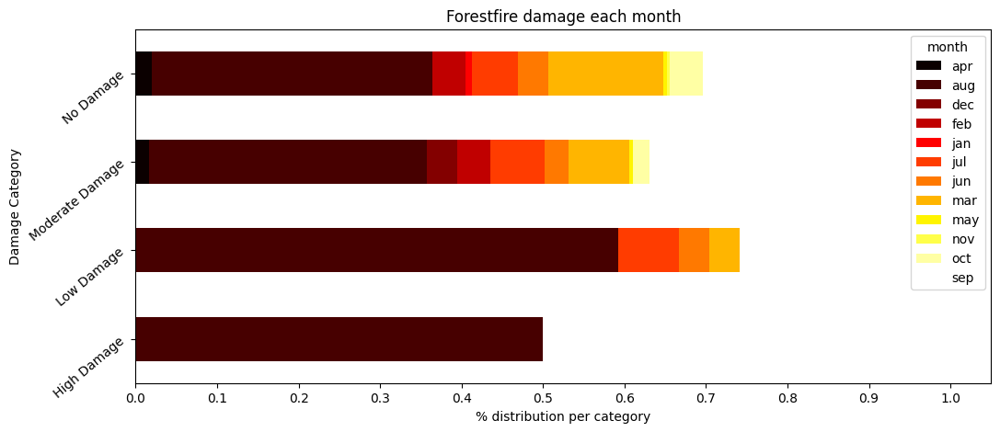

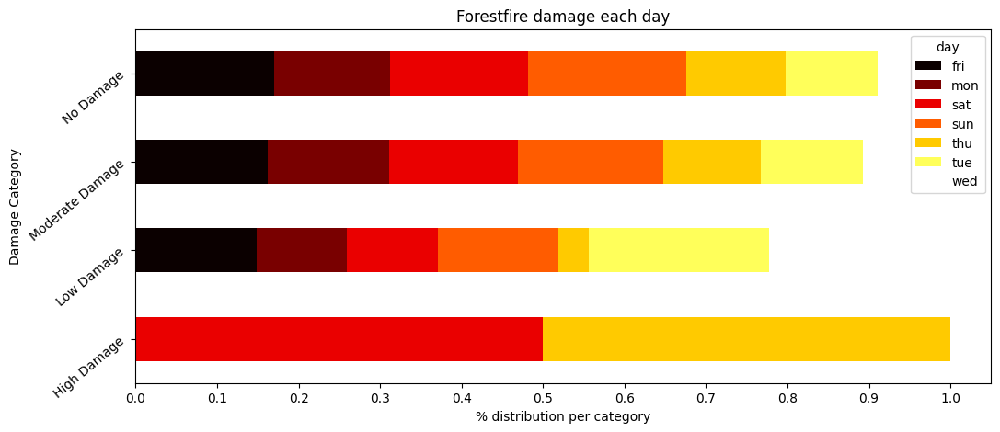

In [27]:
for col in cat_features:
    if col!="size_category":
        cross = pd.crosstab(index=df1['Damage Category'],columns=df[col],normalize='index')
        cross.plot.barh(stacked=True,rot=40,cmap='hot',figsize=(12, 5))
        plt.xlabel('% distribution per category')
        plt.xticks(np.arange(0,1.1,0.1))
        plt.title("Forestfire damage each {}".format(col))
        
plt.show()


- Most of the fires in August were low (< 1 hectare).
- The very high damages(>100 hectares) happened in only 3 months - august,jan and september.

Regarding fire damage per day, nothing much can be observed. 
- There were no very high damaging fires on Friday and on Saturdays it has been reported most.


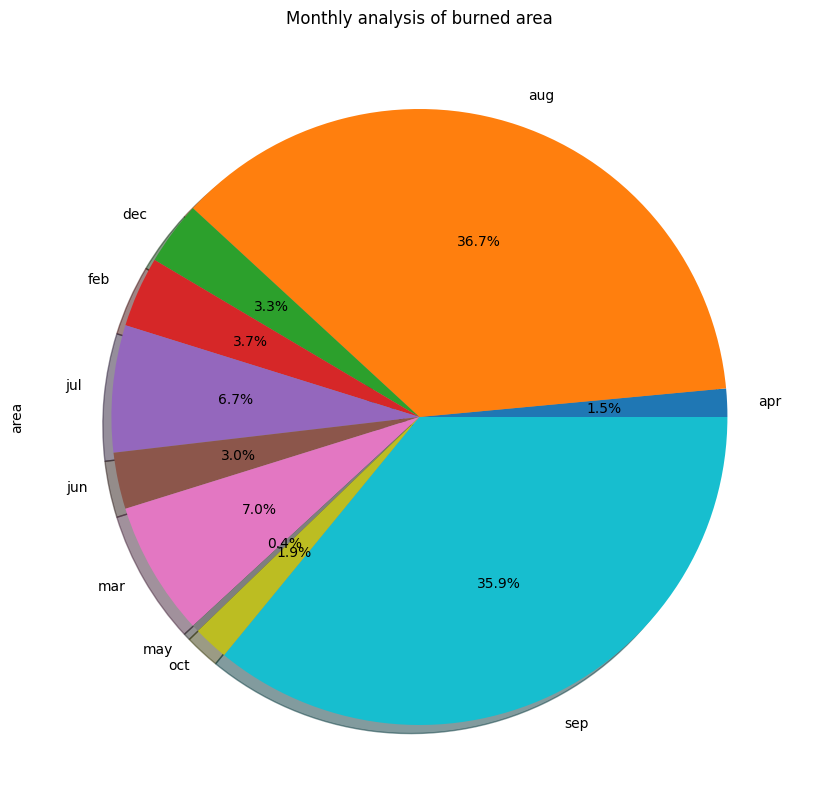

In [28]:
# monthly analysis of burnt area, where the condition is: area>0
area_burned=df1[df1['area']>0]
area_burned.groupby('month')['area'].agg('count').plot(kind='pie',
                                                       title='Monthly analysis of burned area',
                                                       figsize=(10,10),
                                                       shadow=True,
                                                       autopct='%0.1f%%')
plt.show()

- As we can see from the above pie chart,the month of aug and sep have recorded highest % of forest fire i.e 36.8% & 36.1% respectively.
- May Month  recorded least forest fire that is 0.4%.

In [29]:
df2 = data.copy()
#df2.drop('size_category',axis=1, inplace =True)
df2 = pd.get_dummies(df2.iloc[:,:-1])
df2.head()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,month_apr,...,month_nov,month_oct,month_sep,day_fri,day_mon,day_sat,day_sun,day_thu,day_tue,day_wed
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,0,...,0,0,0,1,0,0,0,0,0,0
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,0,...,0,1,0,0,0,0,0,0,1,0
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,0,...,0,1,0,0,0,1,0,0,0,0
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,0,...,0,0,0,1,0,0,0,0,0,0
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,0,...,0,0,0,0,0,0,1,0,0,0


Text(0.5, 1.0, 'Correlation with Forest Fire Size Category ')

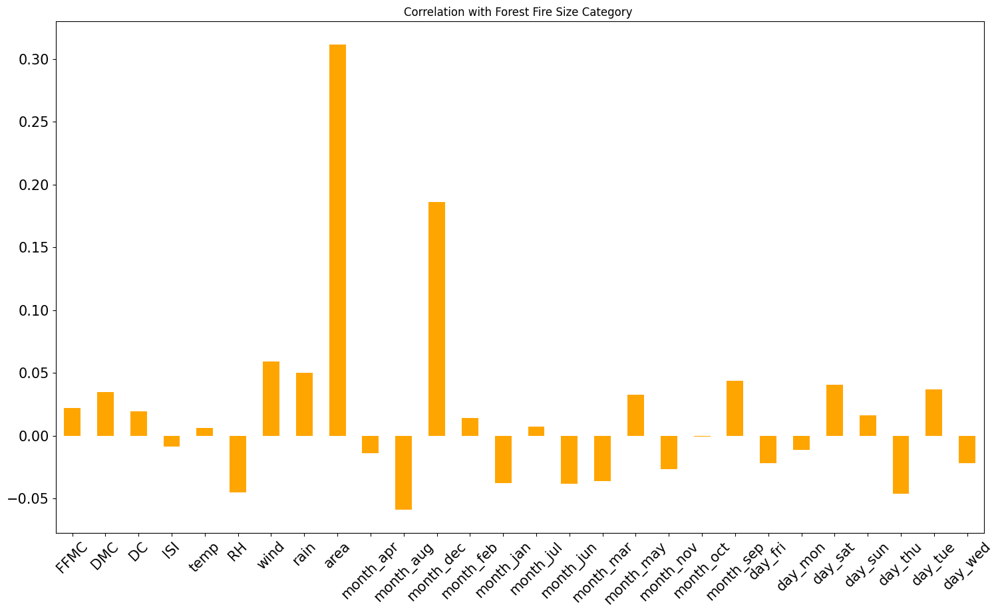

In [30]:
df1['size_category'] = np.where(df['size_category'].str.contains("large"), 1, 0)

correlations = df2.corrwith(df1.size_category)
correlations = correlations[correlations!=1]
pos_corr = correlations[correlations >0].sort_values(ascending = False)
neg_corr =correlations[correlations<0].sort_values(ascending = False)

correlations.plot.bar(
        figsize = (18, 10), 
        fontsize = 15, 
        color = 'orange',
        rot = 45)

plt.title('Correlation with Forest Fire Size Category ')

### Analysis of the Target column
- It is very important to look at the response column, which holds the information, which we are going to predict. 
- In our case we should look at 'size_category' column and compare its values to other columns. 
- First of all we should look at the category 'small' and 'large' in the Dependent column 'size-category'.

In [31]:
df.size_category.value_counts()#unique()

small    378
large    139
Name: size_category, dtype: int64

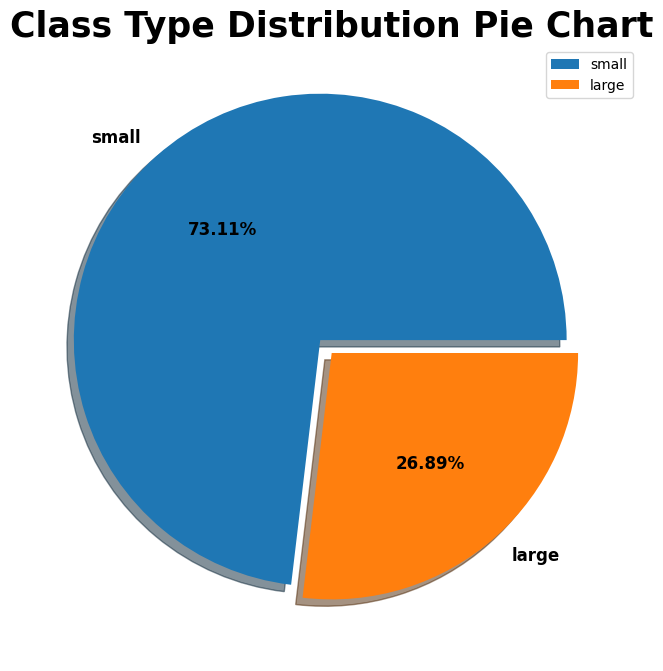

In [32]:
plt.figure(figsize = (12,8))
plt.pie(df['size_category'].value_counts(),
       labels=df.size_category.unique(),
       explode = [0.07,0.0],
       autopct= '%.2f%%',
        shadow= True,
       textprops = {'size':'large',
                   'fontweight':'bold',
                    'color':'black'})
plt.legend(loc= 'upper right')
plt.title("Class Type Distribution Pie Chart", fontsize = 25, fontweight = 'bold')
plt.show()

So above we can see that the data is highly imbalanced, so we see first result with imbalanced data and the we check after SMOTE technique. 

In [33]:
df1

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category,Damage Category
0,mar,fri,9.284396,5.118594,9.710819,2.258318,2.863564,7.141428,2.588436,0.000000,0.000000,0,No Damage
1,oct,tue,9.518403,5.949790,25.866967,2.588436,4.242641,5.744563,0.948683,0.000000,0.000000,0,No Damage
2,oct,sat,9.518403,6.610598,26.208777,2.588436,3.820995,5.744563,1.140175,0.000000,0.000000,0,No Damage
3,mar,fri,9.576012,5.770615,8.803408,3.000000,2.880972,9.848858,2.000000,0.447214,0.000000,0,No Damage
4,mar,sun,9.449868,7.162402,10.109402,3.098387,3.376389,9.949874,1.341641,0.000000,0.000000,0,No Damage
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,9.033272,7.529940,25.799225,1.378405,5.272571,5.656854,1.643168,0.000000,2.537716,1,Moderate Damage
513,aug,sun,9.033272,7.529940,25.799225,1.378405,4.679744,8.426150,2.408319,0.000000,7.368175,1,Moderate Damage
514,aug,sun,9.033272,7.529940,25.799225,1.378405,4.604346,8.366600,2.588436,0.000000,3.340659,1,Moderate Damage
515,aug,sat,9.715966,12.083046,24.793144,3.361547,5.059644,6.480741,2.000000,0.000000,0.000000,0,No Damage


# Train-Test Split

In [34]:
x=df2.copy()
y=df1['size_category']

In [35]:
x.columns

Index(['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area',
       'month_apr', 'month_aug', 'month_dec', 'month_feb', 'month_jan',
       'month_jul', 'month_jun', 'month_mar', 'month_may', 'month_nov',
       'month_oct', 'month_sep', 'day_fri', 'day_mon', 'day_sat', 'day_sun',
       'day_thu', 'day_tue', 'day_wed'],
      dtype='object')

In [36]:
y

0      0
1      0
2      0
3      0
4      0
      ..
512    1
513    1
514    1
515    0
516    0
Name: size_category, Length: 517, dtype: int32

In [37]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=100,stratify=y)
print("Shape of X_train: ",x_train.shape)
print("Shape of X_test: ", x_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)


Shape of X_train:  (361, 28)
Shape of X_test:  (156, 28)
Shape of y_train:  (361,)
Shape of y_test (156,)


### Grid search using Train Test Splits Stratifying Target feature on Imbalanced Dataset

In [38]:
def score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")


## Run Support vector Machine

In [39]:
svm = SVC()
svm.fit(x_train, y_train)

score(svm, x_train, y_train, x_test, y_test, train=True)
score(svm, x_train, y_train, x_test, y_test, train=False)


Train Result:
Accuracy Score: 76.18%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.754286   1.000000  0.761773    0.877143      0.820309
recall       1.000000   0.113402  0.761773    0.556701      0.761773
f1-score     0.859935   0.203704  0.761773    0.531819      0.683607
support    264.000000  97.000000  0.761773  361.000000    361.000000
_______________________________________________
Confusion Matrix: 
 [[264   0]
 [ 86  11]]

Test Result:
Accuracy Score: 73.72%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.735484   1.000000  0.737179    0.867742      0.806700
recall       1.000000   0.023810  0.737179    0.511905      0.737179
f1-score     0.847584   0.046512  0.737179    0.447048      0.631910
support    114.000000  42.000000  0.737179  156.000000    156.000000
___

- In both the condition, due to imbalanced dataset our results are getting biased towards the majority. 
- The model is correctly classifying all the majority classes yet fails to classify the minority classes. 
- Hence, we need to use some kind of oversampling techniques to balance the dataset.


## Handling imbalance data using SMOTE based techniques
### 1.SMOTE Oversampling Technique

In [40]:
counter=Counter(y_train)
print('Before: ',counter)

smt=SMOTE()
x_train_sm,y_train_sm=smt.fit_resample(x_train,y_train)

counter=Counter(y_train_sm)
print('After: ',counter)

Before:  Counter({0: 264, 1: 97})
After:  Counter({0: 264, 1: 264})


### 2.ADASYN: Adaptive Synthetic Sampling Approach

In [41]:
counter = Counter(y_train)
print('Before',counter)

ads = ADASYN(random_state=130)
x_train_ada, y_train_ada = ads.fit_resample(x_train, y_train)

counter = Counter(y_train_ada)
print('After',counter)

Before Counter({0: 264, 1: 97})
After Counter({1: 277, 0: 264})


### 3 Hybridization: SMOTE + Tomek Links

- Hybridization techniques involve combining both undersampling and oversampling techniques. 
- This is done to optimize the performance of classifier models for the samples created as part of these techniques.

- SMOTE+TOMEK is such a hybrid technique that aims to clean overlapping data points for each of the classes distributed in sample space. After the oversampling is done by SMOTE, the class clusters may be invading each other’s space. 

In [42]:
counter = Counter(y_train)
print('Before',counter)

smtom = SMOTETomek(random_state=139)
x_train_smtom, y_train_smtom = smtom.fit_resample(x_train, y_train)

counter = Counter(y_train_smtom)
print('After',counter)

Before Counter({0: 264, 1: 97})
After Counter({0: 256, 1: 256})


### 4 Hybridization: SMOTE + ENN
- SMOTE + ENN is another hybrid technique where more no. of observations are removed from the sample space. 
- Here, ENN is yet another undersampling technique where the nearest neighbors of each of the majority class is estimated.
- If the nearest neighbors misclassify that particular instance of the majority class, then that instance gets deleted.

In [44]:
ounter = Counter(y_train)
print('Before',counter)

smenn = SMOTEENN()
x_train_smenn, y_train_smenn = smenn.fit_resample(x_train, y_train)

counter = Counter(y_train_smenn)
print('After',counter)

Before Counter({0: 256, 1: 256})
After Counter({1: 199, 0: 180})


## Performance Analysis after Resampling and find best out of it

In [45]:
sampled_data = {
    'ACTUAL':[x_train, y_train],
    'SMOTE':[x_train_sm, y_train_sm],
    'ADASYN':[x_train_ada, y_train_ada],
    'SMOTE_TOMEK':[x_train_smtom, y_train_smtom],
    'SMOTE_ENN':[x_train_smenn, y_train_smenn]
}

In [46]:
def test_eval(clf_model, X_test, y_test, algo=None, sampling=None):
    # Test set prediction
    y_prob=clf_model.predict_proba(X_test)
    y_pred=clf_model.predict(X_test)

    print('Confusion Matrix')
    print('='*60)
    print(confusion_matrix(y_test,y_pred),"\n")
    print('Classification Report')
    print('='*60)
    print(classification_report(y_test,y_pred),"\n")
    print('AUC-ROC')
    print('='*60)
    print(roc_auc_score(y_test, y_prob[:,1]))
    
    #x = roc_auc_score(y_test, y_prob[:,1])
    f1 = f1_score(y_test, y_pred, average='binary')
    recall = recall_score(y_test, y_pred, average='binary')
    precision = precision_score(y_test, y_pred, average='binary')
          
    
    return algo,precision,recall,f1,sampling


In [47]:
model_params = {

    'SVC' : {
        'model' : SVC(probability=True),
        'params' :[ {'C':[1, 10, 100, 1000], 'kernel':['linear']},
               {'C':[1, 10, 100, 1000], 'kernel':['rbf'], 'gamma':[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]},
               {'C':[1, 10, 100, 1000], 'kernel':['poly'], 'degree': [2,3,4] ,'gamma':[0.01,0.02,0.03,0.04,0.05]} 
                  ]
    }
}

In [48]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=5,n_repeats=3, random_state=1)
output = []
for model , model_hp in model_params.items():
    for resam , data in sampled_data.items():
        clf = RandomizedSearchCV(model_hp['model'], model_hp['params'],cv = cv, scoring='f1_weighted', n_jobs=-1 )
        clf.fit(data[0], data[1])
        clf_best = clf.best_estimator_
        print('x'*60)
        print(model+' with ' + resam)
        print('='*60)
        output.append(test_eval(clf_best, x_test, y_test, model, resam))


xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SVC with ACTUAL
Confusion Matrix
[[111   3]
 [  0  42]] 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.97      0.99       114
           1       0.93      1.00      0.97        42

    accuracy                           0.98       156
   macro avg       0.97      0.99      0.98       156
weighted avg       0.98      0.98      0.98       156
 

AUC-ROC
0.9991645781119466
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SVC with SMOTE
Confusion Matrix
[[111   3]
 [  0  42]] 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.97      0.99       114
           1       0.93      1.00      0.97        42

    accuracy                           0.98       156
   macro avg       0.97      0.99      0.98       156
weighted avg       0.98      0.98      0.98       156
 

AUC-ROC
0.9979114452798663
xxxxxxx

As the results can be compared, the Hybridization technique using SMOTE_Tomek gave the best results we are going to use it further i.e the AUC score

In [49]:
x_train,x_test,y_train,y_test = train_test_split(x_train_smtom,y_train_smtom,test_size=0.3,random_state=12, stratify=y_train_smtom)

counter = Counter(y_train_smtom)
print('Before',counter)

counter = Counter(y_train)
print('After',counter)

print("Shape of X_train: ",x_train.shape)
print("Shape of X_test: ", x_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)

Before Counter({0: 256, 1: 256})
After Counter({0: 179, 1: 179})
Shape of X_train:  (358, 28)
Shape of X_test:  (154, 28)
Shape of y_train:  (358,)
Shape of y_test (154,)


In [51]:
# initiating the model
model = SVC(kernel='linear', probability=True,random_state=5)

# fit the model
model.fit(x_train, y_train)

SVC(kernel='linear', probability=True, random_state=5)

In [52]:
y_pred=model.predict(x_test)
print('SVC model using Linear kernal Accuracy Score :',accuracy_score(y_test,y_pred))
print('  ')
print('SVC model using Linear kernal Classification Report :\n',classification_report(y_test,y_pred))


SVC model using Linear kernal Accuracy Score : 0.987012987012987
  
SVC model using Linear kernal Classification Report :
               precision    recall  f1-score   support

           0       0.99      0.99      0.99        77
           1       0.99      0.99      0.99        77

    accuracy                           0.99       154
   macro avg       0.99      0.99      0.99       154
weighted avg       0.99      0.99      0.99       154



In [53]:
print('Training set score: ',model.score(x_train, y_train)*100)

print('Test set score: ',model.score(x_test, y_test)*100)


Training set score:  100.0
Test set score:  98.7012987012987


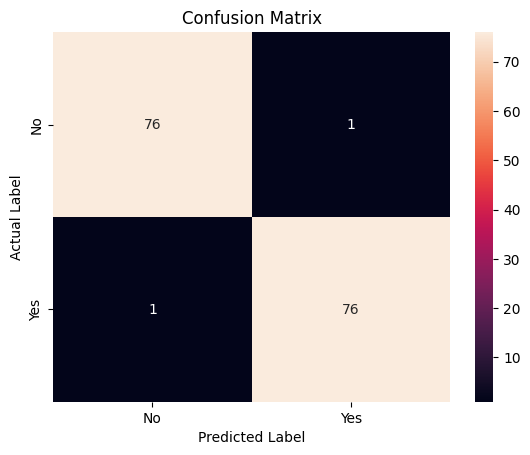

In [54]:
cm_df=confusion_matrix(y_test, y_pred)
class_label = ["No", "Yes"]
df_cm = pd.DataFrame(cm_df, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

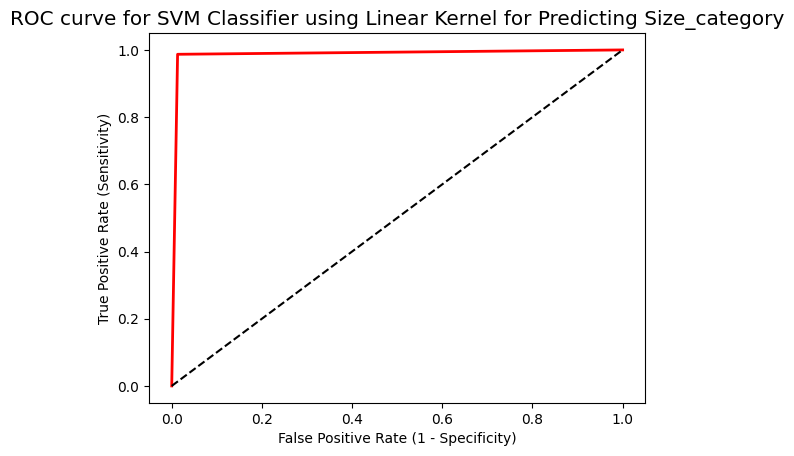

ROC AUC :  0.987012987012987


In [55]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

plt.plot(fpr, tpr, linewidth=2, color='red')
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12

plt.title('ROC curve for SVM Classifier using Linear Kernel for Predicting Size_category')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

ROC_AUC = roc_auc_score(y_test, y_pred)

print('ROC AUC : ',ROC_AUC)

### SVM using Sigmoid kernal

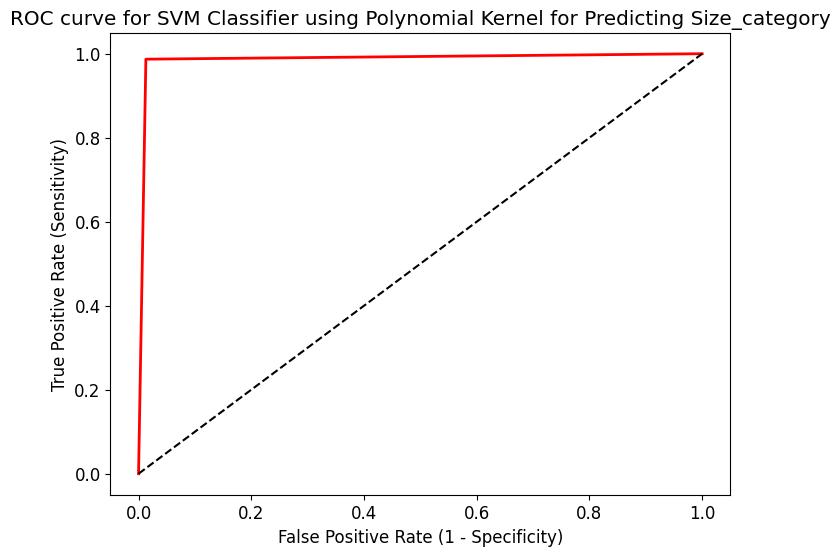

ROC AUC : 0.9870


In [56]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, linewidth=2, color='red')
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for SVM Classifier using Polynomial Kernel for Predicting Size_category')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()
ROC_AUC = roc_auc_score(y_test, y_pred)
print('ROC AUC : {:.4f}'.format(ROC_AUC))

## HyperParametre Tuning for accuracy

In [57]:
SVMC = SVC(random_state=50)

svc_param_grid = {'kernel': ['rbf', 'sigmoid', 'poly','linear'], 
                  'gamma': [1, 0.1, 0.01, 0.001],
                  'C': [1000, 100, 10, 1],
                  'tol':[0.001,0.0008,0.0009,0.0011]}

gsSVMC = GridSearchCV(SVMC, param_grid = svc_param_grid, cv = 10, scoring = "accuracy", n_jobs = 6, verbose = 1)

gsSVMC.fit(x_train,y_train)

svm_best = gsSVMC.best_estimator_

gsSVMC.best_score_


Fitting 10 folds for each of 256 candidates, totalling 2560 fits


0.9916666666666668

In [58]:
gsSVMC.best_params_


{'C': 1000, 'gamma': 1, 'kernel': 'linear', 'tol': 0.001}

In [59]:
predict_results = svm_best.predict(x_test)
np.mean(predict_results==y_test)

0.987012987012987

## We see the score using all types of kernal

### From the above information we see that the **linear kernal** give high accuracy score than others.

### According to linear kernal graph:
- There are approximately 73 observations with probability between 0.0 and 0.1 that the size of the fire will be small.
- There are almost equal amount number of observations for probability greater than and less than 0.5.
- Majority of observations predict that the Forest Fire size will be small.

In [60]:
model=SVC(kernel='sigmoid',random_state=10)
model.fit(x_train,y_train)
y_pred=model.predict(x_test)
y_pred_df= pd.DataFrame({'actual': y,
                         'predicted_prob': model.predict(x)})
y_pred_df

,actual,predicted_prob
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
512,1,0
513,1,0
514,1,0
515,0,0


In [61]:
predicted = []
testtrain = np.array(x_train)
for i in range(len(testtrain)):
    predicted.append(model.predict([testtrain[i]]))


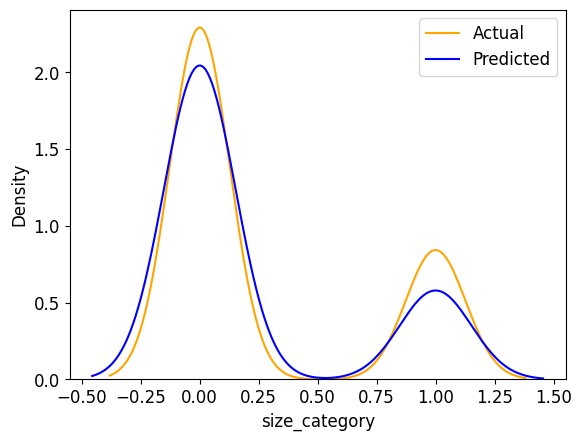

In [62]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()